In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# To have all columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)

In [2]:
# Code to read the data set
CD_0 = pd.read_csv("application_data.csv")
PD_0 = pd.read_csv("previous_application.csv")

# **Current Application Details**

In [3]:
# Creating a shallow copy of data set to prevent any permanent changes in data set
CD = CD_0.copy(deep=False)
CD.shape

(307511, 122)

In [4]:
CD.info(verbose=True, null_counts=True) # verbose - extended info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

**Data Analysis for Current Application Data**

In [5]:
# The % of missing values in all columns
(CD.isnull().mean()*100).sort_values(ascending = False)

COMMONAREA_MEDI                 69.872297
COMMONAREA_AVG                  69.872297
COMMONAREA_MODE                 69.872297
NONLIVINGAPARTMENTS_MODE        69.432963
NONLIVINGAPARTMENTS_AVG         69.432963
NONLIVINGAPARTMENTS_MEDI        69.432963
FONDKAPREMONT_MODE              68.386172
LIVINGAPARTMENTS_MODE           68.354953
LIVINGAPARTMENTS_AVG            68.354953
LIVINGAPARTMENTS_MEDI           68.354953
FLOORSMIN_AVG                   67.848630
FLOORSMIN_MODE                  67.848630
FLOORSMIN_MEDI                  67.848630
YEARS_BUILD_MEDI                66.497784
YEARS_BUILD_MODE                66.497784
YEARS_BUILD_AVG                 66.497784
OWN_CAR_AGE                     65.990810
LANDAREA_MEDI                   59.376738
LANDAREA_MODE                   59.376738
LANDAREA_AVG                    59.376738
BASEMENTAREA_MEDI               58.515956
BASEMENTAREA_AVG                58.515956
BASEMENTAREA_MODE               58.515956
EXT_SOURCE_1                    56

In [6]:
# Removing the columns with more 47% missing values and keeping rest
CD = CD.loc[:, CD.isnull().mean()<=0.47]
CD.shape

(307511, 73)

**Imputation of Current Application Data**

In [7]:
# Imputation of NAME_TYPE_SUITE
CD.NAME_TYPE_SUITE.fillna(CD.NAME_TYPE_SUITE.mode(), inplace=True)
CD.NAME_TYPE_SUITE.mode()

0    Unaccompanied
dtype: object

In [8]:
# Imputation of OCCUPATION_TYPE
CD.OCCUPATION_TYPE.isnull().sum()

96391

In [9]:
# Filling all null values with Not Mentioned as it is categorical column
CD.OCCUPATION_TYPE.fillna("Not Mentioned")

0                      Laborers
1                    Core staff
2                      Laborers
3                      Laborers
4                    Core staff
5                      Laborers
6                   Accountants
7                      Managers
8                 Not Mentioned
9                      Laborers
10                   Core staff
11                Not Mentioned
12                     Laborers
13                      Drivers
14                     Laborers
15                     Laborers
16                      Drivers
17                     Laborers
18                     Laborers
19                   Core staff
20                     Laborers
21                  Sales staff
22                  Sales staff
23                Not Mentioned
24                      Drivers
25               Cleaning staff
26                Cooking staff
27                     Laborers
28                Not Mentioned
29                     Laborers
30                Not Mentioned
31      

In [10]:
CD.OCCUPATION_TYPE.value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

In [11]:
# Imputation of AMT_INCOME_TOTAL
CD.AMT_INCOME_TOTAL.value_counts()

1.350000e+05    35750
1.125000e+05    31019
1.575000e+05    26556
1.800000e+05    24719
9.000000e+04    22483
2.250000e+05    20698
2.025000e+05    16341
6.750000e+04    11147
2.700000e+05    10827
8.100000e+04     6001
3.150000e+05     5862
2.475000e+05     5344
1.260000e+05     4668
3.600000e+05     4115
1.215000e+05     3848
9.900000e+04     3633
2.925000e+05     3418
1.035000e+05     3330
7.650000e+04     3146
1.440000e+05     3123
1.710000e+05     2647
4.500000e+05     2435
1.170000e+05     2390
5.400000e+04     2319
7.200000e+04     2187
1.665000e+05     2053
4.500000e+04     2043
1.080000e+05     1946
3.375000e+05     1790
9.450000e+04     1747
1.620000e+05     1702
1.890000e+05     1691
4.050000e+05     1660
8.550000e+04     1514
1.485000e+05     1486
2.160000e+05     1406
1.305000e+05     1256
5.850000e+04     1182
6.300000e+04     1145
1.935000e+05     1061
1.530000e+05     1012
2.115000e+05      985
3.825000e+05      966
1.395000e+05      834
1.755000e+05      800
5.400000e+

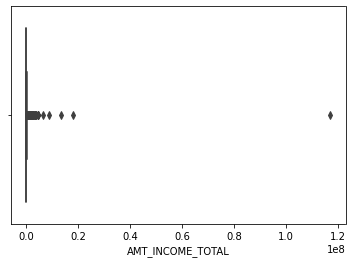

In [12]:
# AMT_INCOME_TOTAL is a continuous variable. So checking for outliers
sns.boxplot(CD.AMT_INCOME_TOTAL)
plt.show()

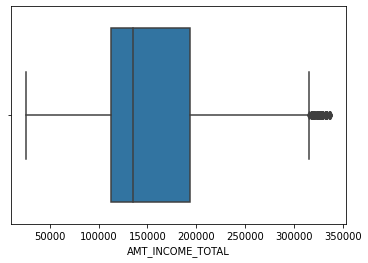

In [13]:
# Removing the outliers
CD_4=CD[(CD.AMT_INCOME_TOTAL)<(CD.AMT_INCOME_TOTAL.quantile(0.95))]
sns.boxplot(CD_4.AMT_INCOME_TOTAL)
plt.show()

In [14]:
# Imputation of AMT_ANNUITY
CD.AMT_ANNUITY.value_counts()

9000.0      6385
13500.0     5514
6750.0      2279
10125.0     2035
37800.0     1602
11250.0     1459
26217.0     1453
20250.0     1345
12375.0     1339
31653.0     1269
26640.0     1236
22500.0     1234
16875.0     1213
36459.0     1191
33025.5      938
26446.5      916
22018.5      904
23773.5      875
25537.5      836
26316.0      829
31261.5      822
21906.0      800
7875.0       741
40320.0      703
21888.0      688
32602.5      687
15750.0      684
27000.0      681
19867.5      653
33750.0      652
21775.5      643
29970.0      643
30528.0      626
45000.0      570
14350.5      564
32895.0      564
14751.0      551
23494.5      540
42790.5      527
26086.5      507
29250.0      506
23931.0      501
31630.5      499
31522.5      495
24939.0      491
16456.5      490
19125.0      471
21109.5      466
13963.5      462
30078.0      450
28408.5      449
45333.0      441
46084.5      436
67500.0      431
16011.0      419
35937.0      418
24543.0      418
25321.5      417
24246.0      4

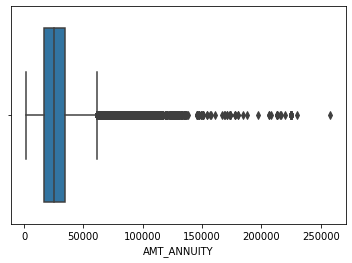

In [15]:
# AMT_ANNUITY is a continuous variable. So checking for outliers
sns.boxplot(CD.AMT_ANNUITY)
plt.show()

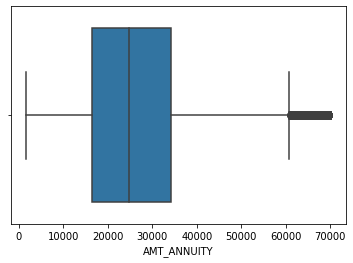

In [16]:
# Removing the outliers
CD_1=CD[(CD.AMT_ANNUITY)<(CD.AMT_ANNUITY.quantile(0.99))]
sns.boxplot(CD_1.AMT_ANNUITY)
plt.show()

In [17]:
# As outliers are present filling the null values with median as outliers are too large and can not use mean
CD.AMT_ANNUITY.fillna(CD.AMT_ANNUITY.median(), inplace=True)
CD.AMT_ANNUITY.median()

24903.0

In [18]:
#Imputing Missing values in the following columns with 0. 
CD[['AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR']]= CD[['AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK' ,'AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR']].fillna(value=0.0)

In [19]:
# Imputation of CNT_FAM_MEMBERS
CD.CNT_FAM_MEMBERS.value_counts()
CD.CNT_FAM_MEMBERS.isnull().sum()

2

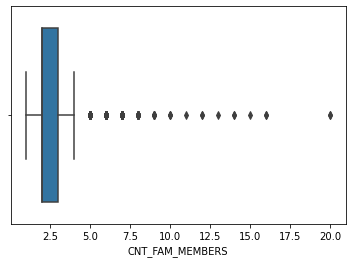

In [20]:
# As 2 null values are present so replacing it with mode as it is categorical column and less number of null values
CD.CNT_FAM_MEMBERS.fillna(CD.CNT_FAM_MEMBERS.mode(), inplace=True)
sns.boxplot(CD.CNT_FAM_MEMBERS)
plt.show()

In [21]:
# Imputation of AMT_GOODS_PRICE
CD.AMT_GOODS_PRICE.value_counts()
CD.AMT_GOODS_PRICE.isnull().sum()

278

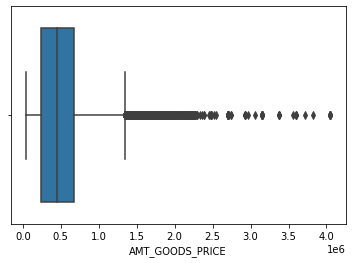

In [22]:
sns.boxplot(CD.AMT_GOODS_PRICE)
plt.show()

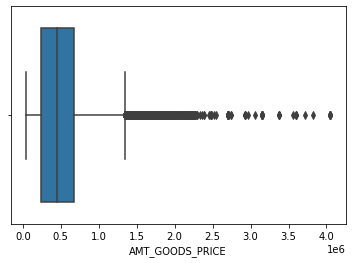

In [23]:
# As outliers are present so replacing it with median
CD.AMT_GOODS_PRICE.fillna(CD.AMT_GOODS_PRICE.median(), inplace=True)
sns.boxplot(CD.AMT_GOODS_PRICE)
plt.show()

In [24]:
#Extracting float type columns
CD.select_dtypes(include='float64').columns

Index(['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

In [25]:
#Converting float type columns to int
extracted_columns = ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'CNT_FAM_MEMBERS',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']
num_col = CD.loc[:,extracted_columns]=CD.loc[:,extracted_columns].apply(lambda col: col.astype('int',errors='ignore'))

In [26]:
#Extracting the object type columns
extracted_columns_1 = list(CD.select_dtypes(include='object').columns)
extracted_columns_1

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE']

In [27]:
# Converting object type to string type
CD.loc[:,extracted_columns_1]=CD.loc[:,extracted_columns_1].apply(lambda col: col.astype('str',errors='ignore'))

In [28]:
#Dropping rows with gender other than male & female
CD['CODE_GENDER'].value_counts()
CD = CD[CD['CODE_GENDER']!='XNA']

**Binning variables for analysis**

In [29]:
# Grouping Total Income
CD.AMT_INCOME_TOTAL.quantile([0,0.1,0.3,0.6,0.8,1])

0.0        25650.0
0.1        81000.0
0.3       112500.0
0.6       162000.0
0.8       225000.0
1.0    117000000.0
Name: AMT_INCOME_TOTAL, dtype: float64

In [30]:
# Binning AMT_INCOME_TOTAL
CD.INCOME_TOTAL_BIN = pd.qcut(CD.AMT_INCOME_TOTAL, q=[0,0.1,0.3,0.6,0.8,1], labels=['Very Low','Low','Medium','High','Very High'])

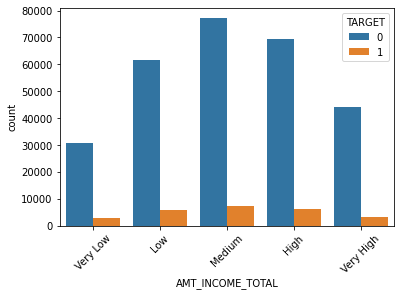

In [31]:
# Plotting of INCOME_TOTAL_BIN as defaulters and non-defaulters
sns.countplot(CD.INCOME_TOTAL_BIN, hue=CD["TARGET"])
plt.xticks(rotation = 45)
plt.show()

In [32]:
# Grouping DAYS_BIRTH
abs(CD.DAYS_BIRTH.quantile([0,0.1,0.3,0.6,0.8,1])) # abs for removing '-' sign

0.0    25229.0
0.1    22181.0
0.3    18885.2
0.6    14416.0
0.8    11694.0
1.0     7489.0
Name: DAYS_BIRTH, dtype: float64

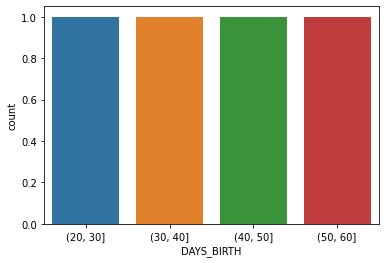

In [33]:
# Plotting of AGE_BIN
CD.AGE_BIN = pd.cut((abs(CD.DAYS_BIRTH)//365).quantile([0,0.1,0.3,0.6,0.8,1]),bins=np.arange(20,70,10))
sns.countplot(CD.AGE_BIN)

**Default & Non Default**

In [34]:
# Creating a function to calculate default percentage in each type of value
def default_percentage(data_set, column):
    default_set = pd.DataFrame(columns=['Value', 'Default %'])
    
    for value in data_set[column].unique():
        default_count = data_set[(data_set[column] == value) & (data_set.TARGET == 1)].shape[0]
        total_count = data_set[data_set[column] == value].shape[0]
        default_set = default_set.append({'Value' : value , 'Default %' : (default_count*100/total_count)}, ignore_index=True)
    return default_set.sort_values(by='Default %', ascending=False)

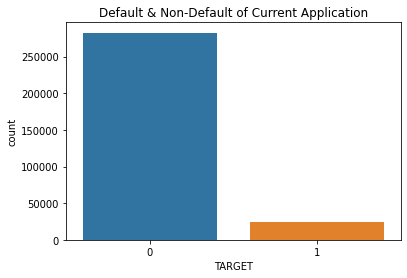

In [35]:
# Imbalance check of target
plt.title("Default & Non-Default of Current Application")
sns.countplot(CD['TARGET'])
plt.show()

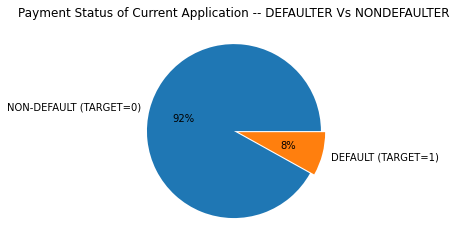

In [36]:
# Plotting Target with percentage of individual value
non_default  = CD[CD["TARGET"] == 0]
default  = CD[CD["TARGET"] == 1]
plt.title("Payment Status of Current Application -- DEFAULTER Vs NONDEFAULTER")
plt.pie(CD['TARGET'].value_counts(normalize=True)*100,labels=['NON-DEFAULT (TARGET=0)','DEFAULT (TARGET=1)'],explode=(0,0.05),autopct='%1.f%%')
plt.show()

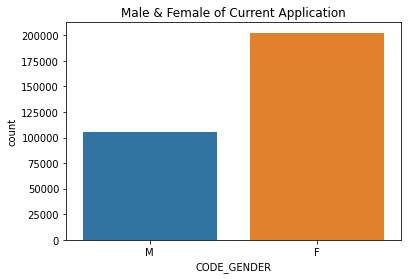

In [37]:
# Imbalance check of gender
plt.title("Male & Female of Current Application")
sns.countplot(CD['CODE_GENDER'])
plt.show()

**Correlation between Numeric Values**

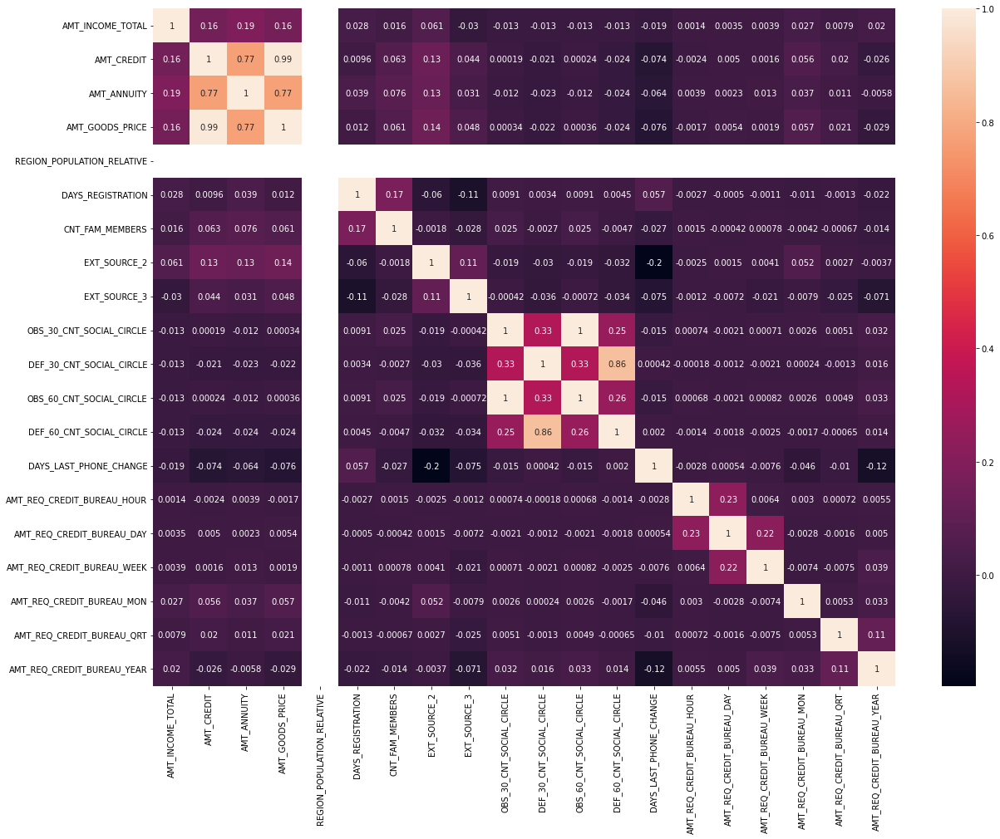

In [38]:
# Plotting Correlation graph of all numeric values
plt.figure(figsize=(20, 15))
sns.heatmap(num_col.corr(), annot=True)
plt.show()

In [39]:
# sanity check of few columns
CD[['FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'TARGET']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307507 entries, 0 to 307510
Data columns (total 3 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   FLAG_OWN_CAR     307507 non-null  object
 1   FLAG_OWN_REALTY  307507 non-null  object
 2   TARGET           307507 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 17.4+ MB


In [40]:
# Using function to calculate default percentage in each value of below mentioned column
default_percentage(CD, 'FLAG_OWN_CAR')

,Value,Default %
0,N,8.500310
1,Y,7.243869


In [41]:
# Using function to calculate default percentage in each value of below mentioned column
default_percentage(CD, 'FLAG_OWN_REALTY')

,Value,Default %
1,N,8.324929
0,Y,7.961727


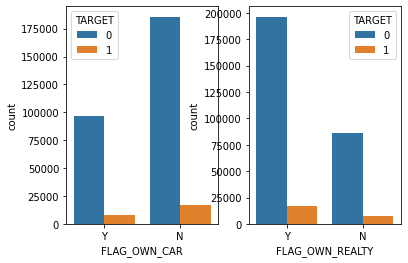

In [42]:
# Plotting defaulter and non-defaulter of car and realty owners
fig = plt.figure()
car=fig.add_subplot(1,2,1)
reality=fig.add_subplot(1,2,2)
sns.countplot(CD['FLAG_OWN_CAR'], hue=CD['TARGET'],order=['Y','N'],ax=car) # Y represent those who have car and N represent those who dont have
sns.countplot(CD['FLAG_OWN_REALTY'], hue=CD['TARGET'],order=['Y','N'],ax=reality) # Y represent those who have realty and N represent those who dont have

plt.show()

Report : 
People not owning reality and car and have a slightly higher default rate than the people who own reality and car

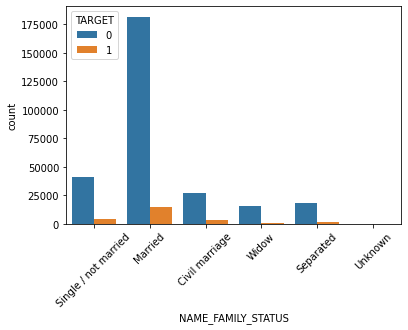

In [43]:
# Plotting defaulter and non-defaulter of NAME_FAMILY_STATUS
sns.countplot(CD.NAME_FAMILY_STATUS, hue=CD["TARGET"])
plt.xticks(rotation = 45)
plt.show()

In [44]:
# Using function to calculate default percentage in each value of below mentioned column
default_per_fam_st=default_percentage(CD, 'NAME_FAMILY_STATUS')
default_per_fam_st

,Value,Default %
2,Civil marriage,9.944918
0,Single / not married,9.807675
4,Separated,8.194234
1,Married,7.559984
3,Widow,5.824217
5,Unknown,0.000000


Report : Default rate is highest for Civil Marriage and Single applicants

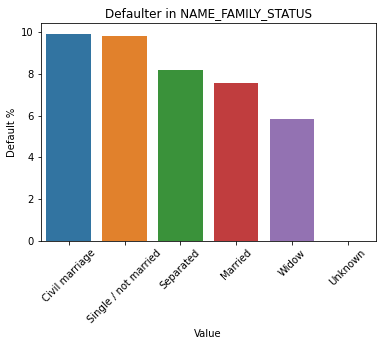

In [45]:
# Plotting default percentage in each value for below mentioned column
sns.barplot(default_per_fam_st["Value"], default_per_fam_st["Default %"])
plt.xticks(rotation = 45)
plt.title("Defaulter in NAME_FAMILY_STATUS")
plt.show()

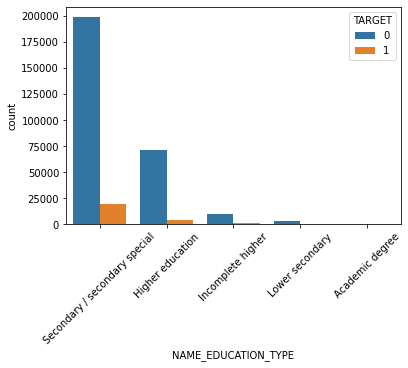

In [46]:
# Plotting Non-defaulter and Defaulter for NAME_EDUCATION_TYPE
sns.countplot(CD.NAME_EDUCATION_TYPE, hue=CD["TARGET"])
plt.xticks(rotation = 45)
plt.show()

In [47]:
# Using function to calculate default percentage in each value of below mentioned column
default_per_edu_ty=default_percentage(CD, 'NAME_EDUCATION_TYPE')
default_per_edu_ty

,Value,Default %
3,Lower secondary,10.927673
0,Secondary / secondary special,8.940011
2,Incomplete higher,8.485792
1,Higher education,5.355187
4,Academic degree,1.829268


Report : Lower secondary has highest default rate

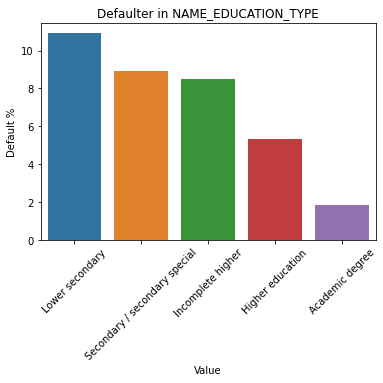

In [48]:
# Plotting default percentage in each value for below mentioned column
sns.barplot(default_per_edu_ty["Value"], default_per_edu_ty["Default %"])
plt.xticks(rotation = 45)
plt.title("Defaulter in NAME_EDUCATION_TYPE")
plt.show()

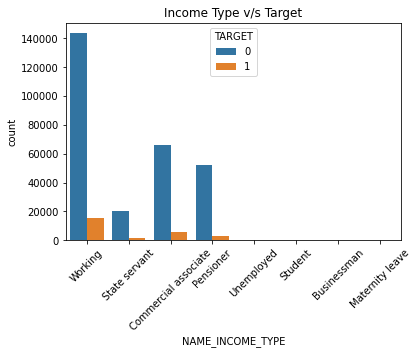

In [49]:
# Plotting Non-defaulter and Defaulter for NAME_INCOME_TYPE
sns.countplot(CD['NAME_INCOME_TYPE'], hue=CD["TARGET"])
plt.xticks(rotation=45)
plt.title("Income Type v/s Target")
plt.show()

In [50]:
# Using function to calculate default percentage in each value of below mentioned column
default_per_inc_ty=default_percentage(CD,'NAME_INCOME_TYPE')
default_per_inc_ty

,Value,Default %
7,Maternity leave,40.000000
4,Unemployed,36.363636
0,Working,9.588653
2,Commercial associate,7.484361
1,State servant,5.754965
3,Pensioner,5.386366
5,Student,0.000000
6,Businessman,0.000000


Report : Applicants on Maternity Leave and Unemployed has highest percentage of Defaulter

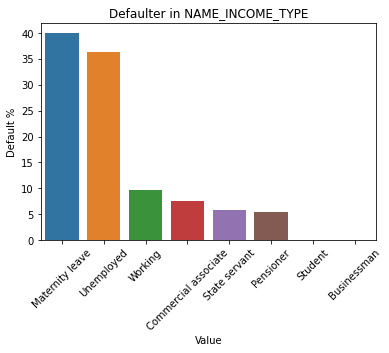

In [51]:
# Plotting default percentage in each value for below mentioned column
sns.barplot(default_per_inc_ty["Value"], default_per_inc_ty["Default %"])
plt.xticks(rotation = 45)
plt.title("Defaulter in NAME_INCOME_TYPE")
plt.show()

In [52]:
# Using function to calculate default percentage in each value of below mentioned column
default_per_occu_ty=default_percentage(CD,'OCCUPATION_TYPE')
default_per_occu_ty

,Value,Default %
14,Low-skill Laborers,17.160612
5,Drivers,11.326130
13,Waiters/barmen staff,11.275964
11,Security staff,10.742449
0,Laborers,10.578770
8,Cooking staff,10.443996
6,Sales staff,9.631799
7,Cleaning staff,9.606705
15,Realty agents,7.856192
16,Secretaries,7.049808


Report : Low skilled labourers have very high rate of defaulters in comparison to other occupations

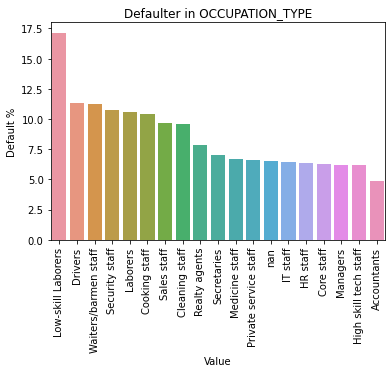

In [53]:
# Plotting default percentage in each value for below mentioned column
sns.barplot(default_per_occu_ty["Value"], default_per_occu_ty["Default %"])
plt.xticks(rotation = 90)
plt.title("Defaulter in OCCUPATION_TYPE")
plt.show()

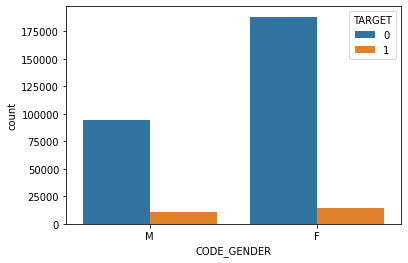

In [54]:
# Plotting Non-defaulter and Defaulter for CODE_GENDER
sns.countplot(CD['CODE_GENDER'], hue=CD["TARGET"])
plt.show()

Report : Female applicants are more than male applicants
Report : Defaulter percentage is higher for male applicants

**Correlation List for Defaulters**

In [55]:
d_corr = default.corr()
c_list = d_corr.unstack()
# Correlations in pair for defaulters
c_list.sort_values(ascending=False).drop_duplicates().head(10)

SK_ID_CURR                  SK_ID_CURR                     1.000000
OBS_30_CNT_SOCIAL_CIRCLE    OBS_60_CNT_SOCIAL_CIRCLE       0.998269
AMT_GOODS_PRICE             AMT_CREDIT                     0.982783
REGION_RATING_CLIENT        REGION_RATING_CLIENT_W_CITY    0.956637
CNT_CHILDREN                CNT_FAM_MEMBERS                0.885484
DEF_30_CNT_SOCIAL_CIRCLE    DEF_60_CNT_SOCIAL_CIRCLE       0.868994
REG_REGION_NOT_WORK_REGION  LIVE_REGION_NOT_WORK_REGION    0.847885
REG_CITY_NOT_WORK_CITY      LIVE_CITY_NOT_WORK_CITY        0.778540
AMT_ANNUITY                 AMT_GOODS_PRICE                0.752296
                            AMT_CREDIT                     0.752195
dtype: float64

Correlation List for Non-Defaulters

In [56]:
nd_corr = non_default.corr()
nd_c_list = nd_corr.unstack()
# Correlations in pair for non-defaulters
nd_c_list.sort_values(ascending=False).drop_duplicates().head(10)

SK_ID_CURR                   SK_ID_CURR                    1.000000
OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE      0.998508
AMT_CREDIT                   AMT_GOODS_PRICE               0.987024
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT          0.950148
CNT_CHILDREN                 CNT_FAM_MEMBERS               0.878570
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION    0.861861
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE      0.859289
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY       0.830381
AMT_ANNUITY                  AMT_GOODS_PRICE               0.776421
AMT_CREDIT                   AMT_ANNUITY                   0.771296
dtype: float64

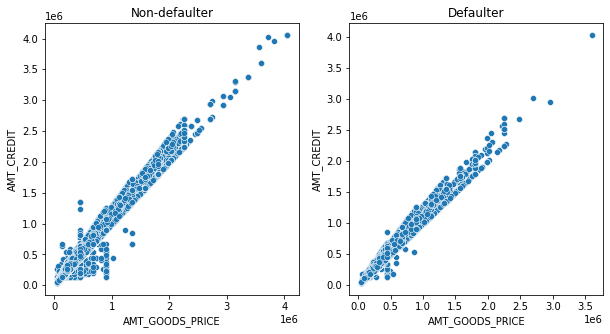

In [57]:
# Plotting Bivariate analysis between AMT_GOODS_PRICE and AMT_CREDIT for Non-defaulter and Defaulter
fig = plt.figure(figsize=(10,5))

ax1 = fig.add_subplot(1, 2, 1, title="Non-defaulter")
ax2 = fig.add_subplot(1, 2, 2, title="Defaulter")

sns.scatterplot(CD[CD["TARGET"] == 0]['AMT_GOODS_PRICE'], CD[CD["TARGET"] == 0]['AMT_CREDIT'], ax=ax1)
sns.scatterplot(CD[CD["TARGET"] == 1]['AMT_GOODS_PRICE'], CD[CD["TARGET"] == 1]['AMT_CREDIT'], ax=ax2)

plt.show()

# **Previous Application Details**

In [58]:
# Creating a shallow copy of data set to prevent any permanent changes in data set
PD = PD_0.copy(deep=False)
PD.shape

(1486234, 37)

In [59]:
PD.info(verbose=True, null_counts=True) # verbose - extended info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1486234 entries, 0 to 1486233
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1486234 non-null  int64  
 1   SK_ID_CURR                   1486234 non-null  int64  
 2   NAME_CONTRACT_TYPE           1486234 non-null  object 
 3   AMT_ANNUITY                  1156124 non-null  float64
 4   AMT_APPLICATION              1486234 non-null  float64
 5   AMT_CREDIT                   1486233 non-null  float64
 6   AMT_DOWN_PAYMENT             692870 non-null   float64
 7   AMT_GOODS_PRICE              1144715 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1486234 non-null  object 
 9   HOUR_APPR_PROCESS_START      1486234 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1486234 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1486234 non-null  int64  
 12  RATE_DOWN_PAYMENT            692870 non-nu

**Data Analysis for Previous Application Data**

In [60]:
# The % of missing values in all columns
(PD.isnull().mean()*100).sort_values(ascending = False)

RATE_INTEREST_PRIVILEGED       99.640366
RATE_INTEREST_PRIMARY          99.640366
AMT_DOWN_PAYMENT               53.380827
RATE_DOWN_PAYMENT              53.380827
NAME_TYPE_SUITE                49.082042
NFLAG_INSURED_ON_APPROVAL      40.150474
DAYS_TERMINATION               40.150474
DAYS_LAST_DUE                  40.150474
DAYS_LAST_DUE_1ST_VERSION      40.150474
DAYS_FIRST_DUE                 40.150474
DAYS_FIRST_DRAWING             40.150407
AMT_GOODS_PRICE                22.978818
AMT_ANNUITY                    22.211173
CNT_PAYMENT                    22.210971
PRODUCT_COMBINATION             0.020454
AMT_CREDIT                      0.000067
NAME_YIELD_GROUP                0.000000
NAME_PORTFOLIO                  0.000000
NAME_SELLER_INDUSTRY            0.000000
SELLERPLACE_AREA                0.000000
CHANNEL_TYPE                    0.000000
NAME_PRODUCT_TYPE               0.000000
SK_ID_PREV                      0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_CLIENT_TYPE

In [61]:
# Removing the columns with more 40% missing values and keeping rest
PD = PD.loc[:, PD.isnull().mean()<=0.4]
PD.shape

(1486234, 26)

**Imputation of Previous Application Data**

In [62]:
# Imputation of AMT_GOODS_PRICE
PD.AMT_GOODS_PRICE.value_counts()
PD.AMT_GOODS_PRICE.isnull().sum()

341519

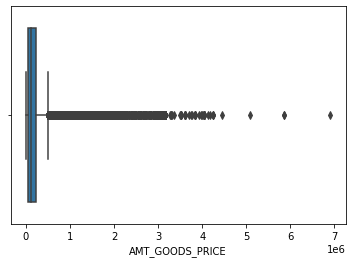

In [63]:
# Plotting value for AMT_GOODS_PRICE
sns.boxplot(PD.AMT_GOODS_PRICE)
plt.show()

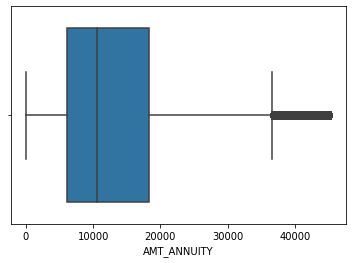

In [64]:
# Removing the outliers
PD_1=PD[(PD.AMT_ANNUITY)<(PD.AMT_ANNUITY.quantile(0.95))]
sns.boxplot(PD_1.AMT_ANNUITY)
plt.show()

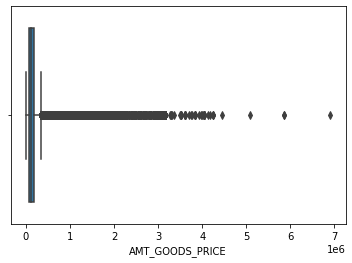

In [65]:
# As outliers are present so replacing it with median
PD.AMT_GOODS_PRICE.fillna(PD.AMT_GOODS_PRICE.median(), inplace=True)
sns.boxplot(PD.AMT_GOODS_PRICE)
plt.show()

In [66]:
# Imputation of AMT_ANNUITY
PD.AMT_ANNUITY.value_counts()
PD.AMT_ANNUITY.isnull().sum()

330110

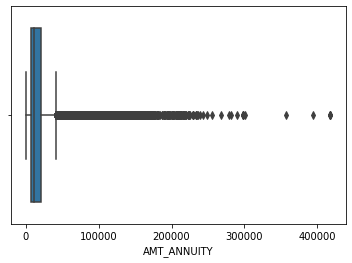

In [67]:
# AMT_ANNUITY is a continuous variable. So checking for outliers
sns.boxplot(PD.AMT_ANNUITY)
plt.show()

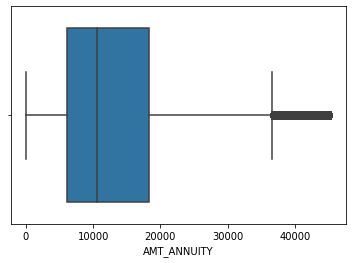

In [68]:
# Removing the outliers
PD_2=PD[(PD.AMT_ANNUITY)<(PD.AMT_ANNUITY.quantile(0.95))]
sns.boxplot(PD_2.AMT_ANNUITY)
plt.show()

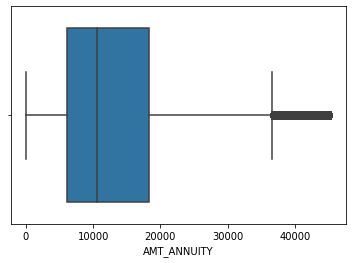

In [69]:
# As outliers are present so replacing it with median
PD_2.AMT_ANNUITY.fillna(PD_2.AMT_ANNUITY.median(), inplace=True)
sns.boxplot(PD_2.AMT_ANNUITY)
plt.show()

In [70]:
# Imputation of CNT_PAYMENT
PD.CNT_PAYMENT.value_counts()
PD.CNT_PAYMENT.isnull().sum()

330107

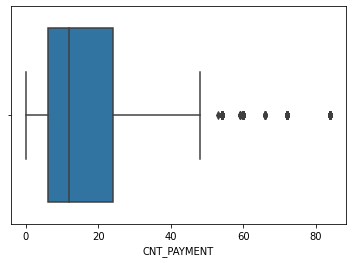

In [71]:
# CNT_PAYMENT is a continuous variable. So checking for outliers
sns.boxplot(PD.CNT_PAYMENT)
plt.show()

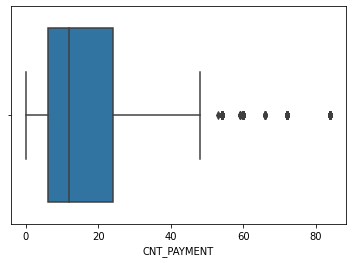

In [72]:
# As outliers are present so replacing it with median
PD_3=PD
PD_3.CNT_PAYMENT.fillna(PD_3.CNT_PAYMENT.mode(), inplace=True)
sns.boxplot(PD_3.CNT_PAYMENT)
plt.show()

# **Merging both Data set**

In [73]:
# Merging both data set for further analysis
merged_df = pd.merge(CD[['SK_ID_CURR', 'TARGET']], PD, how='left', on=['SK_ID_CURR'])
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1280653 entries, 0 to 1280652
Data columns (total 27 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_CURR                   1280653 non-null  int64  
 1   TARGET                       1280653 non-null  int64  
 2   SK_ID_PREV                   1258127 non-null  float64
 3   NAME_CONTRACT_TYPE           1258127 non-null  object 
 4   AMT_ANNUITY                  985627 non-null   float64
 5   AMT_APPLICATION              1258127 non-null  float64
 6   AMT_CREDIT                   1258126 non-null  float64
 7   AMT_GOODS_PRICE              1258127 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1258127 non-null  object 
 9   HOUR_APPR_PROCESS_START      1258127 non-null  float64
 10  FLAG_LAST_APPL_PER_CONTRACT  1258127 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1258127 non-null  float64
 12  NAME_CASH_LOAN_PURPOSE       1258127 non-n

**Removing Outliers**

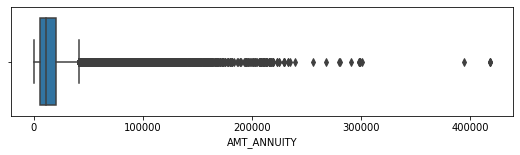

In [74]:
# Plotting AMT_ANNUITY for checking outliers
plt.figure(figsize=(9,2))
sns.boxplot(merged_df['AMT_ANNUITY'])
plt.show()

In [75]:
# Removing outliers from AMT_ANNUITY
merged_df = merged_df[merged_df['AMT_ANNUITY'] < np.nanpercentile(merged_df['AMT_ANNUITY'], 95)]

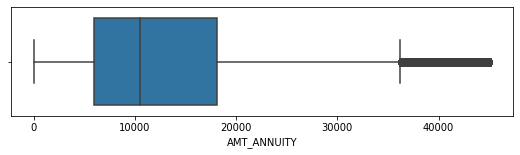

In [76]:
# Plotting AMT_ANNUITY
plt.figure(figsize=(9,2))
sns.boxplot(merged_df['AMT_ANNUITY'])
plt.show()

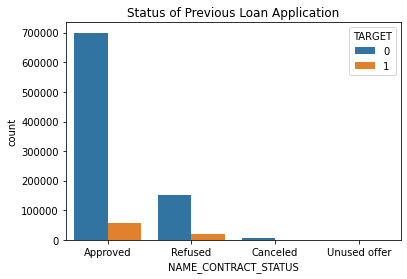

In [77]:
# Plotting for Defaulters and Non-Defaulters for NAME_CONTRACT_STATUS
plt.title("Status of Previous Loan Application")
sns.countplot(merged_df['NAME_CONTRACT_STATUS'], hue=merged_df['TARGET'])
plt.show()

In [78]:
per_approv=(merged_df[merged_df['NAME_CONTRACT_STATUS'] == "Approved"].shape[0]/merged_df[(merged_df['TARGET'] == 1) & (merged_df['NAME_CONTRACT_STATUS'] == "Approved")].shape[0])
per_approv # Approved percentage of previous application

13.022832305392821

In [79]:
per_refused=(merged_df[merged_df['NAME_CONTRACT_STATUS'] == "Refused"].shape[0]/merged_df[(merged_df['TARGET'] == 1) & (merged_df['NAME_CONTRACT_STATUS'] == "Refused")].shape[0])
per_refused # Approved percentage of previous application

8.535861828679508

Report : 
The applicants whose previous loans were approved are more likely to pay current loan in time, than the applicants whose previous loans were rejected.

7% of the previously approved loan applicants that defaulted in current loan

90 % of the previously refused loan applicants that were able to pay current loan

In [80]:
# Using function to calculate default percentage in each value of below mentioned column
default_per_gd_cat=default_percentage(merged_df, 'NAME_GOODS_CATEGORY')
default_per_gd_cat

,Value,Default %
0,Vehicles,10.049423
23,Insurance,9.433962
3,XNA,9.352931
17,Auto Accessories,9.279127
13,Jewelry,9.255621
2,Mobile,8.650438
19,Office Appliances,8.558559
20,Weapon,8.474576
21,Direct Sales,8.421053
8,Computers,8.024594


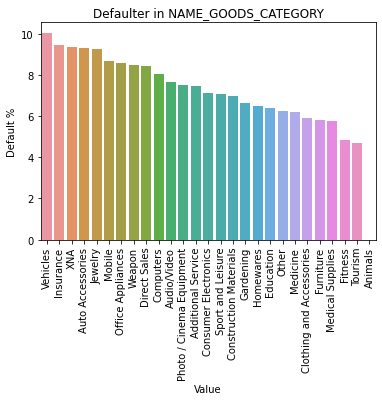

In [81]:
# Plotting default percentage in each value for below mentioned column
sns.barplot(default_per_gd_cat["Value"], default_per_gd_cat["Default %"])
plt.xticks(rotation = 90)
plt.title("Defaulter in NAME_GOODS_CATEGORY")
plt.show()

Report : People with insurance and vehicles are among highest defaulters

In [82]:
# Using function to calculate default percentage in each value of below mentioned column
default_per_pr_ty=default_percentage(merged_df, 'NAME_PRODUCT_TYPE')
default_per_pr_ty

,Value,Default %
2,walk-in,12.678334
1,x-sell,8.268108
0,XNA,7.676780


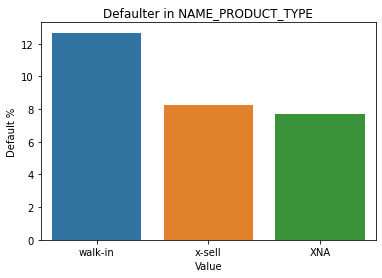

In [83]:
# Plotting default percentage in each value for below mentioned column
sns.barplot(default_per_pr_ty["Value"], default_per_pr_ty["Default %"])
plt.title("Defaulter in NAME_PRODUCT_TYPE")
plt.show()

Report : People with walk-in are among highest defaulters 

In [84]:
# Using function to calculate default percentage in each value of below mentioned column
default_per_nm_pf=default_percentage(merged_df, 'NAME_PORTFOLIO')
default_per_nm_pf

,Value,Default %
2,Cards,10.170039
1,Cash,9.115377
0,POS,7.677780
3,Cars,5.776173


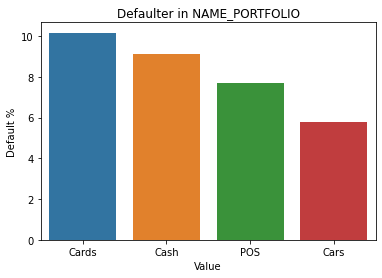

In [85]:
# Plotting default percentage in each value for below mentioned column
sns.barplot(default_per_nm_pf["Value"], default_per_nm_pf["Default %"])
plt.title("Defaulter in NAME_PORTFOLIO")
plt.show()

Report : People with **cards** are among highest defaulters

In [86]:
# Using function to calculate default percentage in each value of below mentioned column
default_per_pd_com=default_percentage(merged_df, 'PRODUCT_COMBINATION')
default_per_pd_com

,Value,Default %
14,Cash Street: middle,11.567132
5,Cash X-Sell: high,11.543015
7,Cash Street: high,11.372741
13,Card Street,11.142311
11,Cash Street: low,10.421047
4,Card X-Sell,9.361839
9,POS mobile with interest,8.792468
0,POS other with interest,8.045636
8,Cash X-Sell: middle,7.923897
2,POS mobile without interest,7.889702


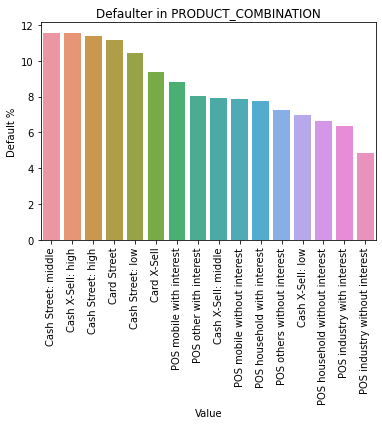

In [87]:
# Plotting default percentage in each value for below mentioned column
sns.barplot(default_per_pd_com["Value"], default_per_pd_com["Default %"])
plt.xticks(rotation = 90)
plt.title("Defaulter in PRODUCT_COMBINATION")
plt.show()

Report : Highest defaulters are among Cash Street: middle, Cash X-Sell: high, Cash Street: high, Card Street

In [88]:
# Using function to calculate default percentage in each value of below mentioned column
default_per_nm_si=default_percentage(merged_df, 'NAME_SELLER_INDUSTRY')
default_per_nm_si

,Value,Default %
0,Auto technology,10.559006
3,XNA,9.356607
2,Connectivity,9.133344
9,Jewelry,9.007551
1,Consumer electronics,7.550299
7,Industry,7.279006
4,Construction,6.637911
5,Furniture,6.083044
6,Clothing,5.905395
10,MLM partners,5.873715


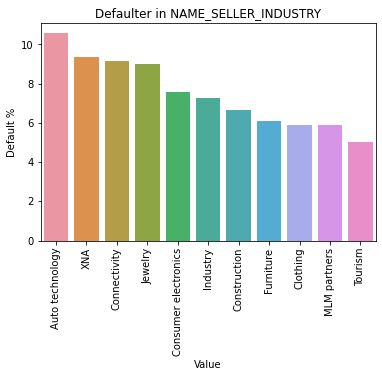

In [89]:
# Plotting default percentage in each value for below mentioned column
sns.barplot(default_per_nm_si["Value"], default_per_nm_si["Default %"])
plt.xticks(rotation = 90)
plt.title("Defaulter in NAME_SELLER_INDUSTRY")
plt.show()

Report : Auto technology are highest defaulters and Tourism have lowest defaulters

In [90]:
# Using function to calculate default percentage in each value of below mentioned column
default_per_nm_yg=default_percentage(merged_df, 'NAME_YIELD_GROUP')
default_per_nm_yg

,Value,Default %
3,XNA,10.170039
2,high,9.531091
1,middle,8.061285
0,low_normal,7.225040
4,low_action,6.618272


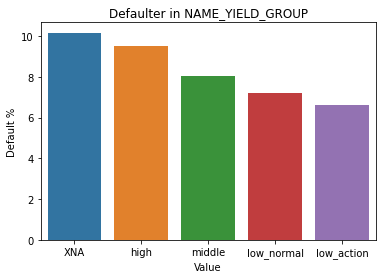

In [91]:
# Plotting default percentage in each value for below mentioned column
sns.barplot(default_per_nm_yg["Value"], default_per_nm_yg["Default %"])
plt.title("Defaulter in NAME_YIELD_GROUP")
plt.show()

Report : Highest defaulters are Unknown but next highest defaulters are from high yield group people

In [92]:
# Using function to calculate default percentage in each value of below mentioned column
default_per_cn_ty=default_percentage(merged_df, 'CHANNEL_TYPE')
default_per_cn_ty

,Value,Default %
4,AP+ (Cash loan),12.884901
5,Contact center,9.749410
3,Credit and cash offices,8.888832
1,Country-wide,8.184123
2,Regional / Local,7.629448
0,Stone,7.352950
6,Channel of corporate sales,6.137617
7,Car dealer,5.423729


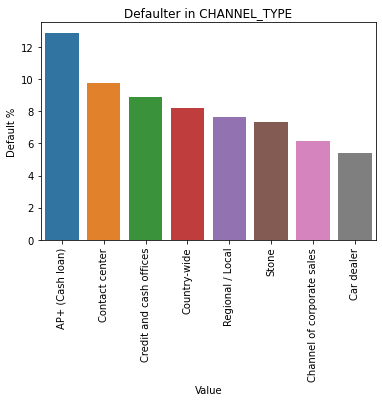

In [93]:
# Plotting default percentage in each value for below mentioned column
sns.barplot(default_per_cn_ty["Value"], default_per_cn_ty["Default %"])
plt.xticks(rotation = 90)
plt.title("Defaulter in CHANNEL_TYPE")
plt.show()

Report : Highest defaulters are from AP+ (Cash Loan)